# Q2 : Object Recognition with OBR

In [4]:
import numpy as np
import cv2
from skimage.transform import warp
from matplotlib import pyplot as plt
%matplotlib inline
import os
import glob
import operator

## Import and show objects in database

In [5]:
# import and add the all the images to a list 

path = 'noodle_database/'
images = []

for filename in os.listdir(path):
    img = cv2.imread(os.path.join(path,filename))
    if img is not None:
        img=cv2.resize(img,(220,220))
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        images.append(img)

<function matplotlib.pyplot.show(*args, **kw)>

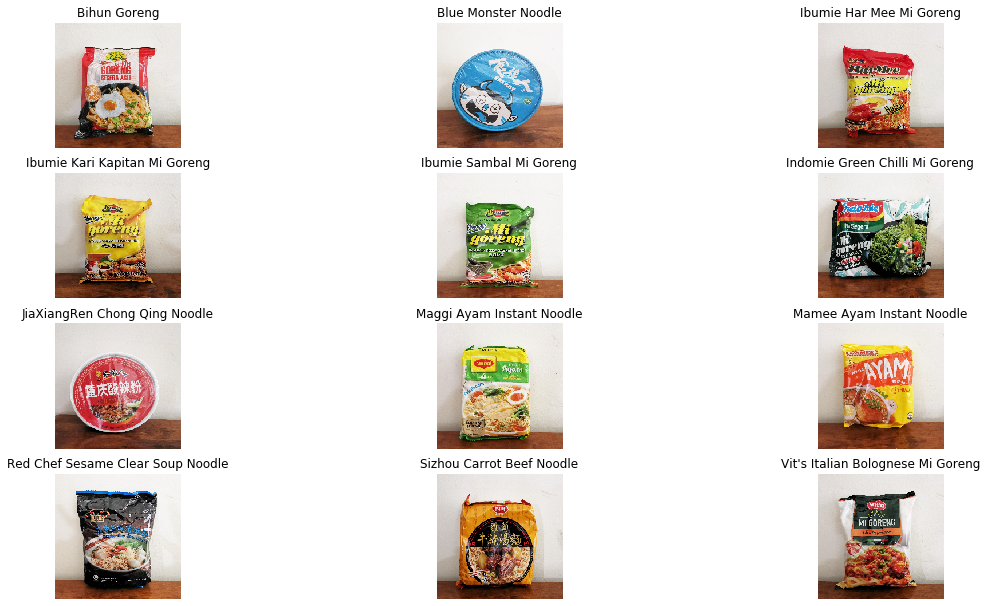

In [6]:
# show the images and their respective filenames

for i in range(len(images)):
    
    list = os.listdir(path)
    titles = [i.split('.', 1)[0] for i in list]
    plt.subplot(4,3,i+1)
    plt.imshow(images[i],cmap='gray')
    plt.title(titles[i])
    plt.axis('off')
    plt.subplots_adjust(left=2.5,right=5,bottom=2,top=4)
    
plt.show

## Implementation

In [7]:
images = np.array(images)

# assign the three query images to the first three items in images[]
qimg_1,qimg_2,qimg_3 = images[0],images[1],images[2]

In [8]:
def get_matches(img_query):
    
    # Initiate ORB detector
    orb = cv2.ORB_create()
    
    # find the keypoints and descriptors 
    kp1, des1 = orb.detectAndCompute(img_query, None)
    
    total_match=[]

    for i in range(len(images)): 
        img_db = images[i]
        kp2, des2 = orb.detectAndCompute(img_db, None)

        # calculate using distance between keypoints with hamming distance 
        bf = cv2.BFMatcher(cv2.NORM_HAMMING)
        matches = bf.knnMatch(des1,des2, k=2) # return the two best matches

        # Apply ratio test
        good = []
        for m,n in matches:
            if m.distance < 0.75*n.distance:
                good.append([m])
        
        total_match.append(len(good)) # add the number of matches for each image to a list
        
        # draw the matches
        img_ORB = cv2.drawMatchesKnn(img_query,kp1,img_db,kp2,good,None, flags=2)
        fig = plt.figure(figsize = (10,10))
        ax = fig.add_subplot(111)
        ax.imshow(img_ORB), plt.axis('off'),plt.title('Result '+str(i+1)),
        plt.text(20,20,str(len(good))+' match(es)',fontsize = 18,bbox=dict(facecolor='red', alpha=3))
    
    max_value = max(total_match) 
    max_index = total_match.index(max_value)        

    return max_value,max_index

In [9]:
def get_best(img_query):
    
    max_value,max_index = get_matches(img_query)
    
    #for i in range(len(images)):
    file = os.listdir(path)[max_index]
    item_name = file.split('.',1)[0]
    print("The query image is",item_name)

## Results

The query image is Bihun Goreng


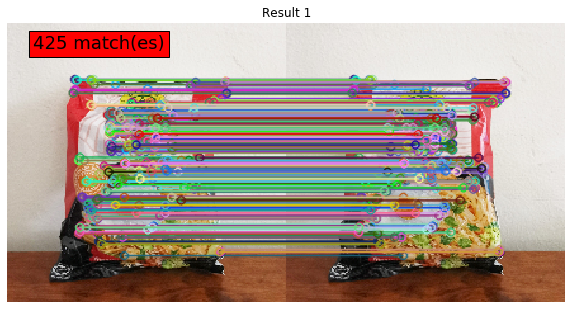

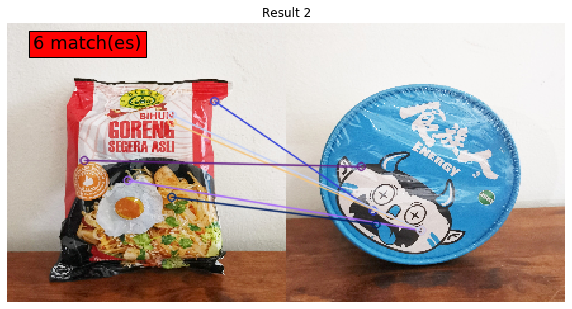

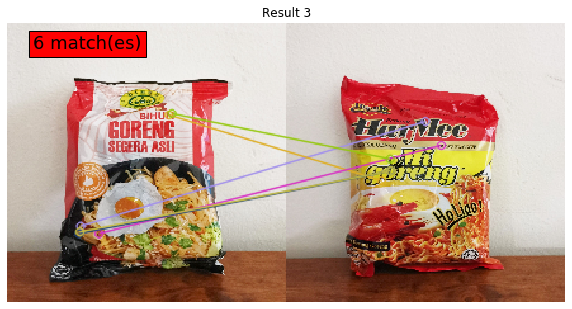

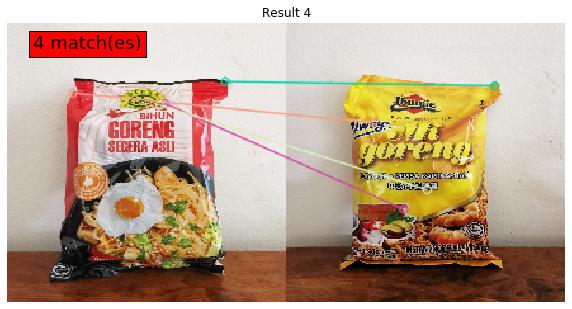

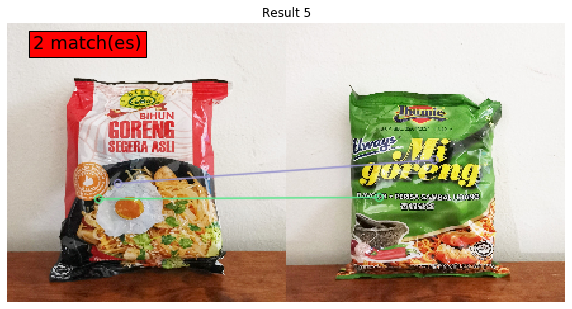

...

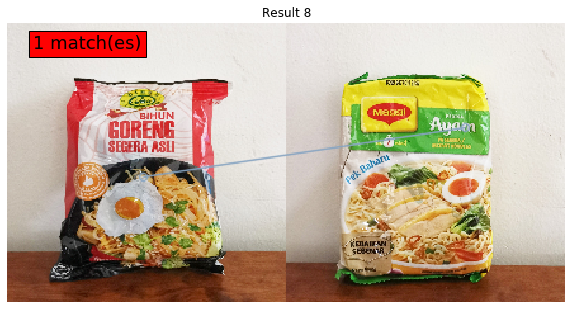

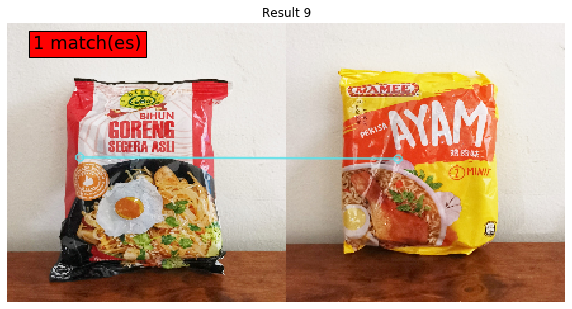

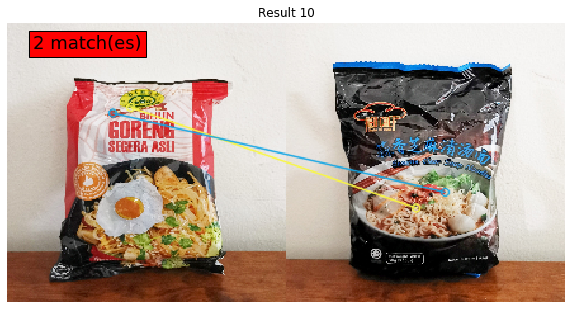

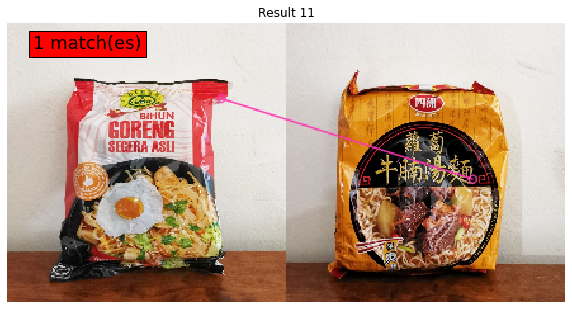

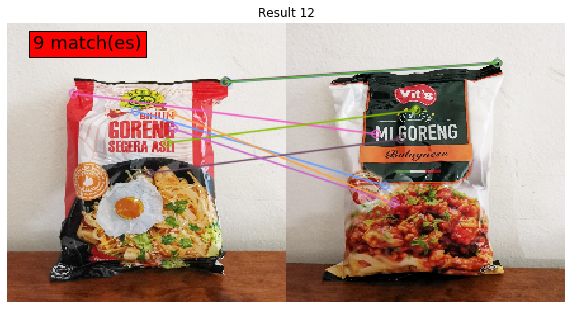

In [526]:
get_best(qimg_1)

The query image is Blue Monster Noodle


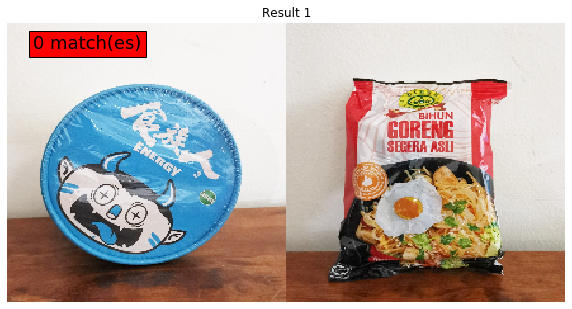

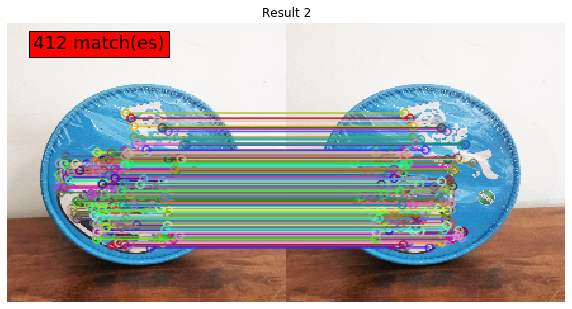

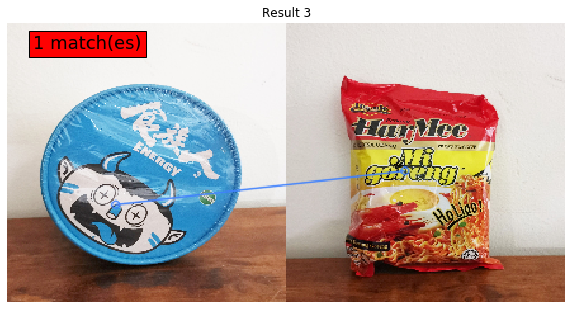

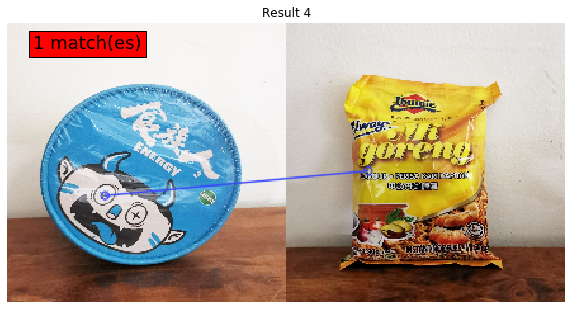

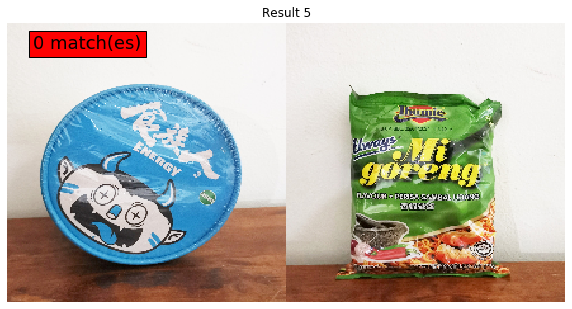

...

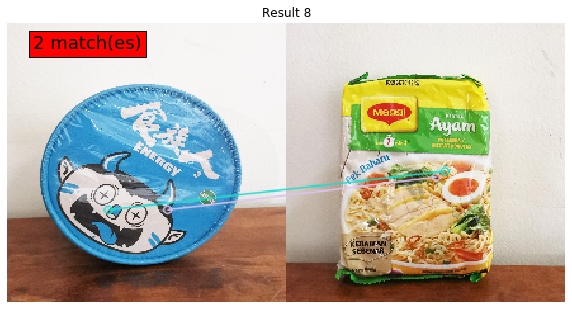

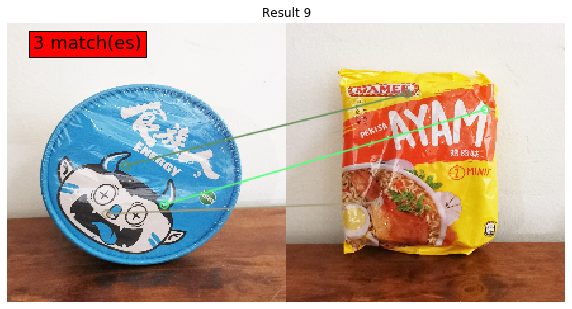

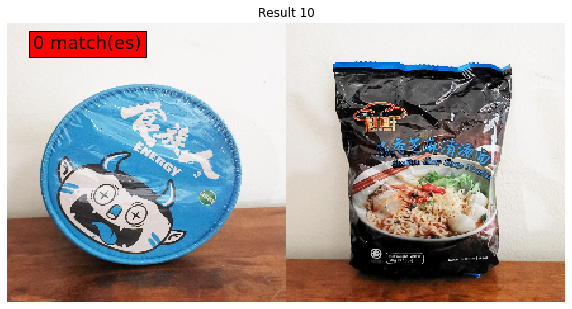

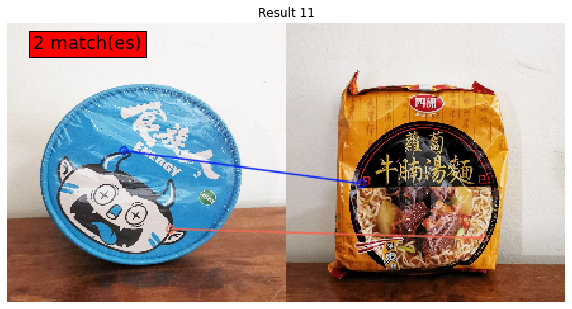

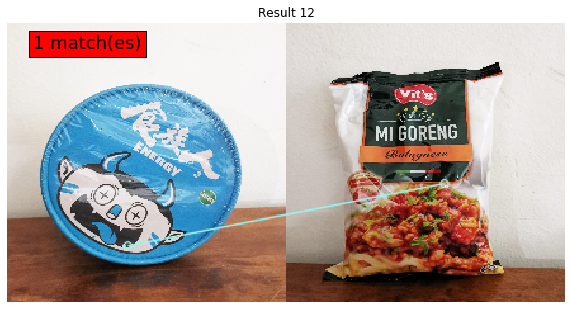

In [527]:
get_best(qimg_2)

The query image is Ibumie Har Mee Mi Goreng


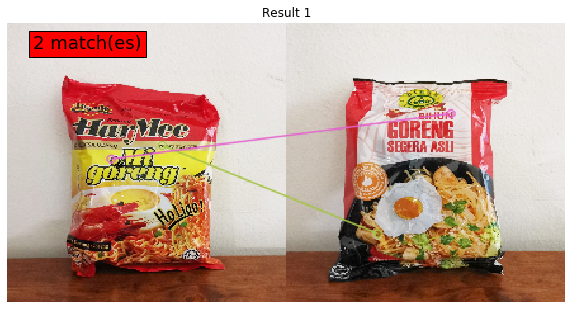

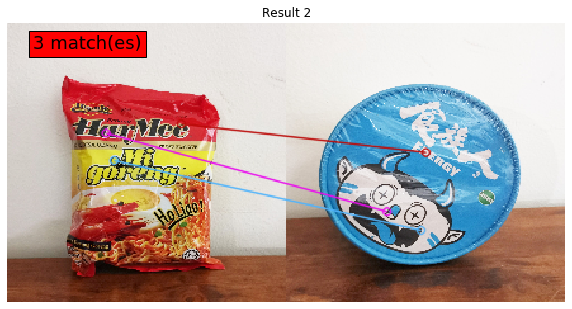

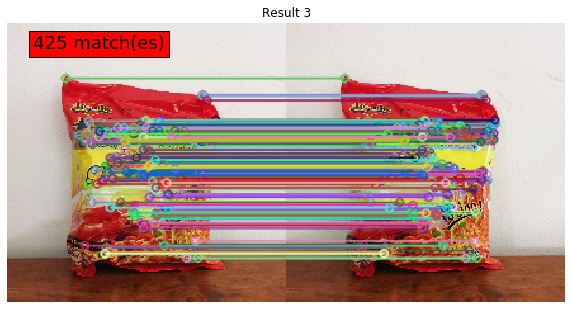

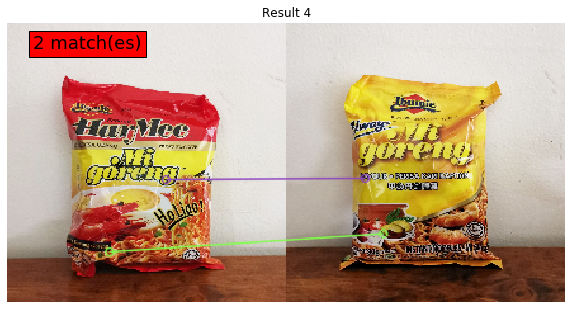

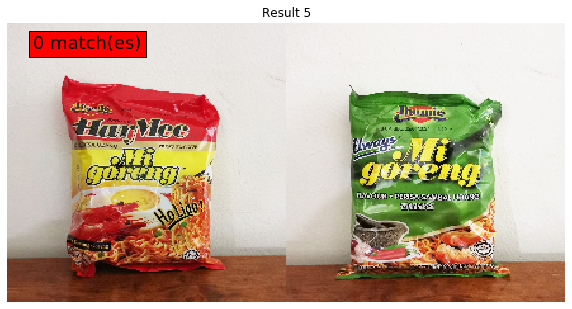

...

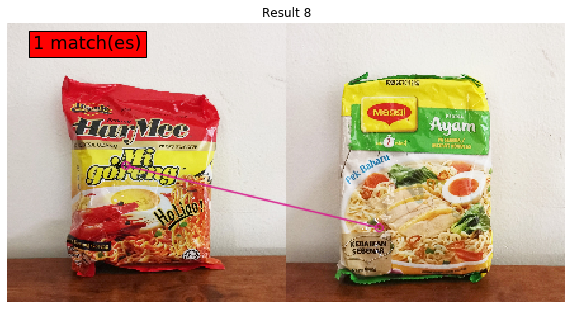

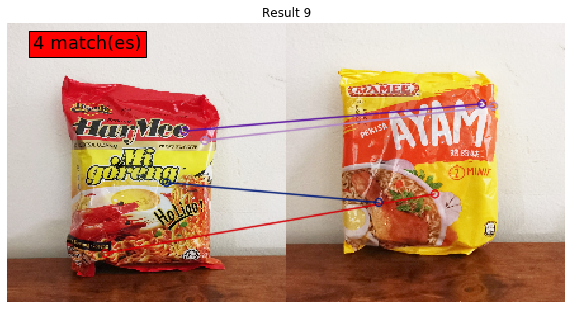

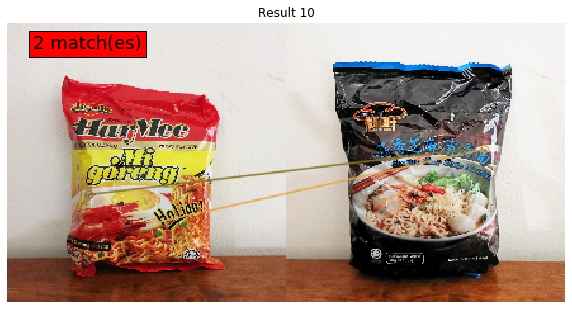

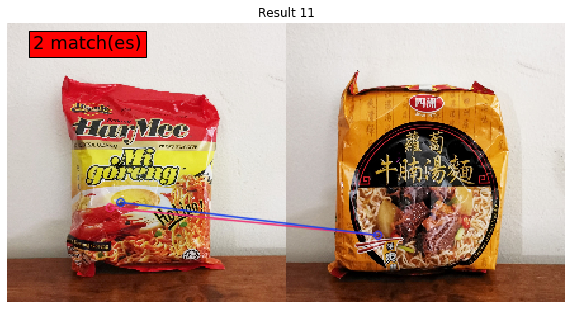

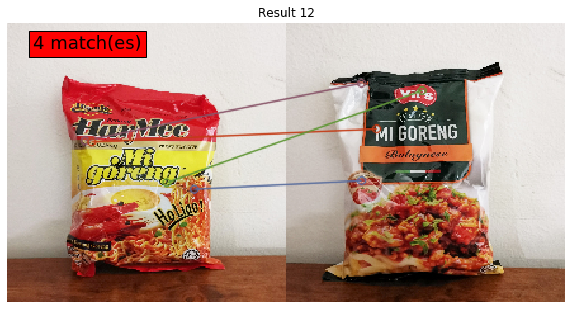

In [528]:
get_best(qimg_3)

The query image is Indomie Green Chilli Mi Goreng


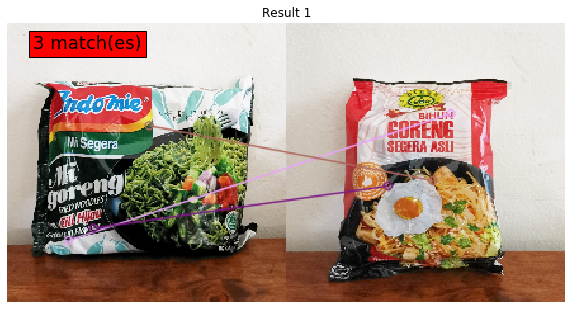

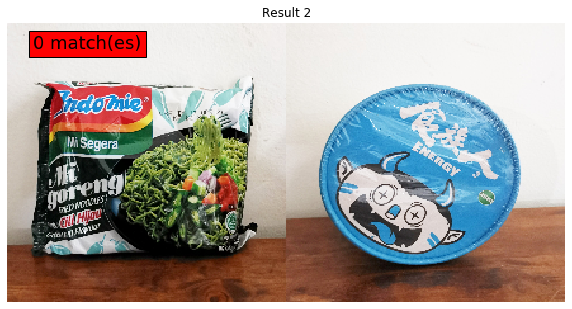

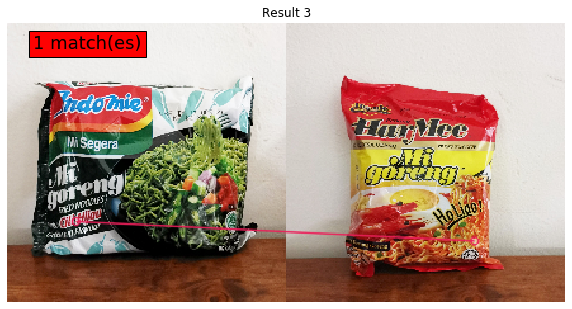

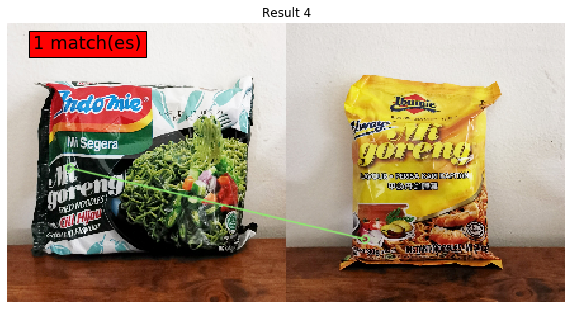

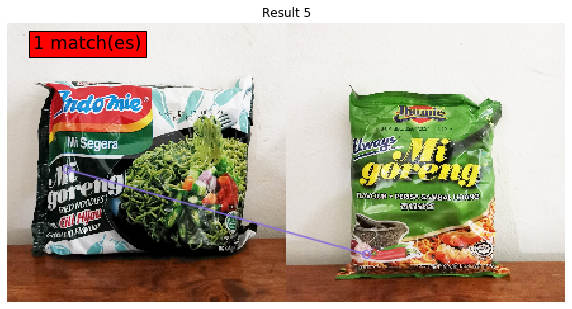

...

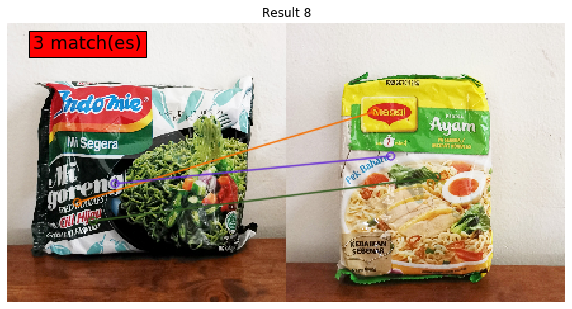

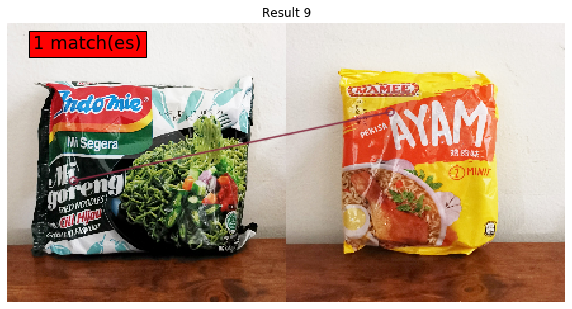

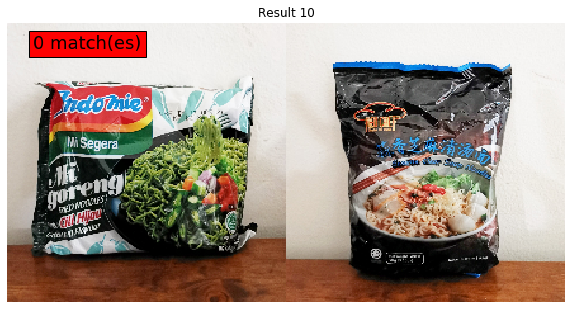

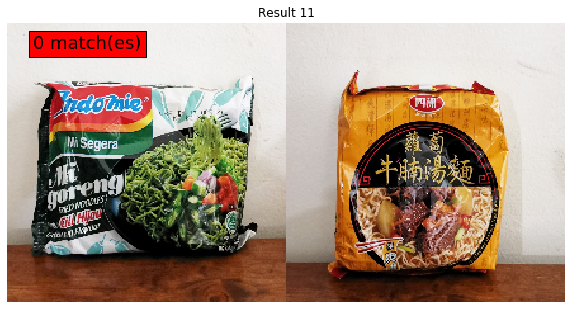

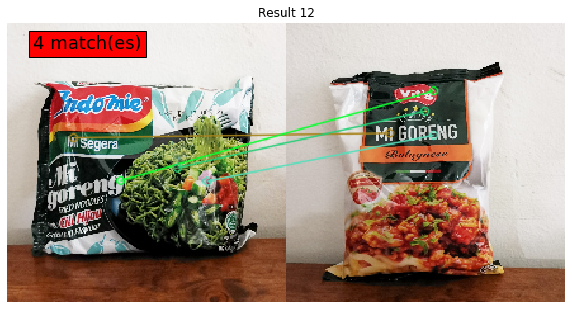

In [10]:
get_best(images[5])